# Data Extraction and EDA

### Importing Libraries

In [51]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
from PIL import Image
import tensorflow as tf
import keras
import seaborn as sns
from keras import layers
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D, BatchNormalization,GlobalMaxPooling2D,GlobalAveragePooling2D
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping , ModelCheckpoint , ReduceLROnPlateau , TensorBoard
from tensorflow.keras.optimizers import Adam, SGD, RMSprop
from tensorflow.keras.applications import EfficientNetB0, EfficientNetB7
from tensorflow.keras.applications.efficientnet import preprocess_input
import keras_tuner as kt
import random
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.regularizers import l1, l2
from sklearn.metrics import confusion_matrix, classification_report
import pickle
import time



### Creating a custom function to extract files

In [67]:
# Set up paths
cwd = os.getcwd()
folder = 'image'
mainFilepath = os.path.join(cwd, folder)
print(mainFilepath)

def extract_images_to_dataframe(main_folder):
    # Initialize an empty list to hold image data and labels
    data = []

    # Function to recursively traverse folders and extract images
    def traverse_folders(folder_path, label, depth, subfolder_name):
        # Loop through each file/folder in the current folder
        for item in os.listdir(folder_path):
            item_path = os.path.join(folder_path, item)
            
            # Check if the item is a directory
            if os.path.isdir(item_path):
                # Recursively traverse the subfolder
                traverse_folders(item_path, label, depth + 1, item)  # Pass current item as subfolder name
            else:
                # Check if the file is an image 
                if item.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp')):
                    original_image_path = item_path

                    # Open the image
                    with Image.open(original_image_path) as imageFile:
                        imageMode = imageFile.mode

                        imageArray = np.array(imageFile)

                        # Get image dimensions and number of channels
                        height, width = imageArray.shape[:2]  # Height and width
                        channels = imageArray.shape[2] if len(imageArray.shape) > 2 else 1  # Channels, grayscale if shape == 2
                        

                        # Append the image array, label, width, height, channels, depth, subfolder name, image mode to the data list
                        data.append((original_image_path, label, width, height, channels, depth, subfolder_name, imageMode))

    # Loop through each subfolder in the main folder
    for label in os.listdir(main_folder):
        label_folder = os.path.join(main_folder, label)
        
        # Check if it is indeed a directory
        if os.path.isdir(label_folder):
            # Traverse the subfolder and its subfolders
            traverse_folders(label_folder, label, 1, label)  # Start with label as initial subfolder name

    # Create a DataFrame with seven columns: 'image', 'label', 'depth', 'subfolder'
    df = pd.DataFrame(data, columns=['path', 'label', 'width','height','channels','depth', 'subfolder','imageMode'])
    return df

/home/ec2-user/image


In [72]:
#creating dataframe
df = extract_images_to_dataframe(mainFilepath)

In [73]:
df.head()

,path,label,width,height,channels,depth,subfolder,imageMode
0,/home/ec2-user/image/aerosol_cans/default/Imag...,aerosol_cans,256,256,3,2,default,RGB
1,/home/ec2-user/image/aerosol_cans/default/Imag...,aerosol_cans,256,256,3,2,default,RGB
2,/home/ec2-user/image/aerosol_cans/default/Imag...,aerosol_cans,256,256,3,2,default,RGB
3,/home/ec2-user/image/aerosol_cans/default/Imag...,aerosol_cans,256,256,3,2,default,RGB
4,/home/ec2-user/image/aerosol_cans/default/Imag...,aerosol_cans,256,256,3,2,default,RGB


In [74]:
set(df.imageMode)

{'CMYK', 'L', 'P', 'RGB', 'RGBA'}

RGBA is an extension of the RGB model that includes an alpha channel for transparency. The alpha channel determines the opacity of the color; a value of 0 means fully transparent, while a value of 255 means fully opaque. Like RGB, each channel (R, G, B) ranges from 0 to 255, while the alpha channel also ranges from 0 to 255.

The CMYK color model is a subtractive color model used in color printing. It works by subtracting varying percentages of cyan, magenta, yellow, and black from white light to produce colors.  Each channel (C, M, Y, K) typically has values ranging from 0% to 100%, representing the amount of each ink used.

The L mode represents grayscale images where each pixel contains only intensity information without color. The "L" stands for "luminance."  There are typically 256 shades of gray ranging from black (0) to white (255).

P mode refers to Palette-based images. It uses an indexed color palette with up to 256 colors. Each pixel in a P mode image stores an index that points to a color in the palette rather than storing full RGB values.

In [75]:
df.describe()

,width,height,channels,depth
count,13613.000000,13613.000000,13613.000000,13613.0
mean,286.607361,279.391611,2.999486,2.0
std,184.393327,162.563927,0.069101,0.0
min,125.000000,125.000000,1.000000,2.0
25%,256.000000,256.000000,3.000000,2.0
50%,256.000000,256.000000,3.000000,2.0
75%,256.000000,256.000000,3.000000,2.0
max,4832.000000,6793.000000,4.000000,2.0


We have a total of 13613 images.

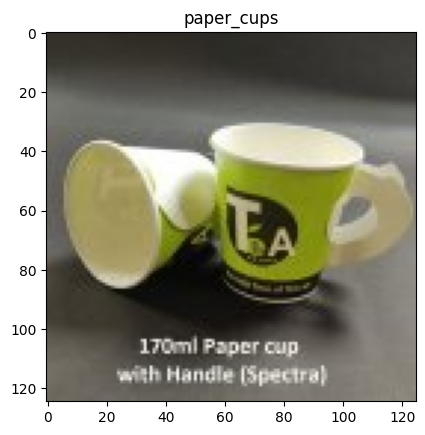

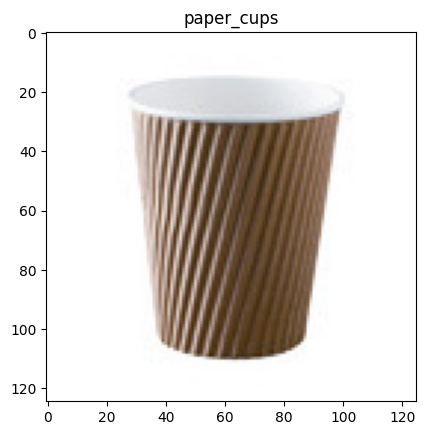

In [63]:
#visual inspection on images with width of 125 pixels

for i in df[df.width == 125].index:
    plt.imshow(Image.open(df.path[i]))
    plt.title(f'{df.iloc[i,1]}')
    plt.show()

In [ ]:
#visual inspection on images with 1 channel

for i in df[df.channels == 1].index:
    plt.imshow(Image.open(df.path[i]))
    plt.title(f'{df.iloc[i,1]}')
    plt.show()

In [ ]:
for i in df[df.channels == 4].index:
    plt.imshow(Image.open(df.path[i]))
    plt.title(f'{df.iloc[i,1]}')
    plt.show()

In [64]:
df.imageMode.value_counts()

imageMode
RGB     13584
RGBA       16
P           9
L           3
CMYK        1
Name: count, dtype: int64

/tmp/ipykernel_415847/1431969433.py:2: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  random_samples = df.groupby('label').apply(lambda x: x.sample(n=2, random_state=109)).reset_index(drop=True)


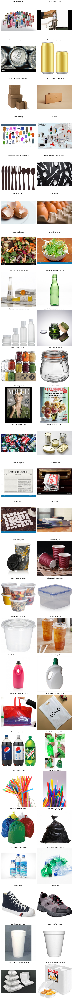

In [84]:
# Randomly sample 2 images from each label
random_samples = df.groupby('label').apply(lambda x: x.sample(n=2, random_state=109)).reset_index(drop=True)

# Set up the plot
num_samples = len(random_samples)
fig, axes = plt.subplots(nrows=num_samples//2, ncols=2, figsize=(10, num_samples//2 * 5))
axes = axes.flatten()  # Flatten the axes array for easy indexing

# Display the sampled images
for ax, (index, row) in zip(axes, random_samples.iterrows()):
    img = plt.imread(row['path'])  # Read the image file
    ax.imshow(img)  # Display the image
    ax.set_title(f"Label: {row['label']}")  # Set the title to the label
    ax.axis('off')  # Turn off axis

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()  # Show the plot with images

In [87]:
df.label.nunique()   # 26 labels

26

### Converting all images of non-RBG modes to RBG

In [88]:
def RGBimages_to_dataframe(main_folder):
    # Initialize an empty list to hold image data and labels
    data = []

    # Function to recursively traverse folders and extract images
    def traverse_folders(folder_path, label, depth, subfolder_name):
        # Loop through each file/folder in the current folder
        for item in os.listdir(folder_path):
            item_path = os.path.join(folder_path, item)
            
            # Check if the item is a directory
            if os.path.isdir(item_path):
                # Recursively traverse the subfolder
                traverse_folders(item_path, label, depth + 1, item)  # Pass current item as subfolder name
            else:
                # Check if the file is an image
                if item.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp')):
                    original_image_path = item_path

                    # Open the image
                    image = Image.open(original_image_path)

                    # Convert to RGB if it's not already in that mode
                    if image.mode != 'RGB':
                        rgb_image = image.convert('RGB') 

                        # Save the processed image as JPEG
                        processed_image_path = os.path.join(folder_path, f"processed_{item}.jpg")
                        rgb_image.save(processed_image_path, format='JPEG')


                        # Append processed image data to the list
                        data.append((processed_image_path, label, depth, subfolder_name, rgb_image.mode))

                         # Delete the original file after successful conversion
                        try:
                            os.remove(original_image_path)
                            print(f"Deleted original file: {original_image_path}")
                        except Exception as e:
                            print(f"Error deleting file {original_image_path}: {e}")
                            
                    else:
                        # If already in RGB mode, just append the original image path
                        data.append((original_image_path, label, depth, subfolder_name, image.mode))

    # Loop through each subfolder in the main folder
    for label in os.listdir(main_folder):
        label_folder = os.path.join(main_folder, label)
        
        # Check if it is indeed a directory
        if os.path.isdir(label_folder):
            # Traverse the subfolder and its subfolders
            traverse_folders(label_folder, label, 1, label)  # Start with label as initial subfolder name

    # Create a DataFrame with five columns: 'path', 'label', 'depth', 'subfolder', and 'imageMode'
    df = pd.DataFrame(data, columns=['path', 'label', 'depth', 'subfolder', 'imageMode'])
    return df

In [89]:
df2 = RGBimages_to_dataframe(mainFilepath)

Deleted original file: /home/ec2-user/image/aerosol_cans/real_world/spray_cans 138.jpg
Deleted original file: /home/ec2-user/image/aluminum_soda_cans/default/beverage_cans 6.jpg
Deleted original file: /home/ec2-user/image/aluminum_soda_cans/real_world/beverage_cans 213.jpg
Deleted original file: /home/ec2-user/image/aluminum_soda_cans/real_world/beverage_cans 238.jpg
Deleted original file: /home/ec2-user/image/aluminum_soda_cans/real_world/beverage_cans 262.jpg


/home/ec2-user/.local/lib/python3.9/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Deleted original file: /home/ec2-user/image/cardboard_packaging/real_world/cardboard 205.jpg
Deleted original file: /home/ec2-user/image/newspaper/default/news_paper 167.jpg
Deleted original file: /home/ec2-user/image/paper/default/paper 1.jpg
Deleted original file: /home/ec2-user/image/paper/default/paper 125.jpg
Deleted original file: /home/ec2-user/image/paper/default/paper 151.jpg
Deleted original file: /home/ec2-user/image/paper/default/paper 143.jpg
Deleted original file: /home/ec2-user/image/paper/real_world/paper 1035.jpg
Deleted original file: /home/ec2-user/image/paper/real_world/paper 1056.jpg
Deleted original file: /home/ec2-user/image/paper/real_world/paper 318.jpg
Deleted original file: /home/ec2-user/image/paper_cups/default/paper_cups 280.jpg
Deleted original file: /home/ec2-user/image/paper_cups/default/paper_cups 281.jpg
Deleted original file: /home/ec2-user/image/paper_cups/default/paper_cups 282.jpg
Deleted original file: /home/ec2-user/image/paper_cups/default/pape

In [90]:
df2.head()

,path,label,depth,subfolder,imageMode
0,/home/ec2-user/image/aerosol_cans/default/Imag...,aerosol_cans,2,default,RGB
1,/home/ec2-user/image/aerosol_cans/default/Imag...,aerosol_cans,2,default,RGB
2,/home/ec2-user/image/aerosol_cans/default/Imag...,aerosol_cans,2,default,RGB
3,/home/ec2-user/image/aerosol_cans/default/Imag...,aerosol_cans,2,default,RGB
4,/home/ec2-user/image/aerosol_cans/default/Imag...,aerosol_cans,2,default,RGB


In [91]:
set(df2.imageMode)  #check if all images are "RBG" mode

{'RGB'}

### Setting a global seed for replicability

In [93]:
# Set the global random seed
seed_value = 10

# Set Python random seed
random.seed(seed_value)

# Set NumPy random seed
np.random.seed(seed_value)

# Set TensorFlow random seed
tf.random.set_seed(seed_value)

In [94]:
# Split the data into train, validate, and test sets
# We will use a common split ratio of 70% training, 15% validation, and 15% testing.
train_df, temp_df = train_test_split(df2, test_size=0.3, stratify=df2['label'], random_state=seed_value)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['label'], random_state=seed_value)

print(f'Train set: {len(train_df)}, Validation set: {len(val_df)}, Test set: {len(test_df)}')
train_df.index
val_df.index
test_df.index

Train set: 9529, Validation set: 2042, Test set: 2042


Index([ 3468, 12043,  6399, 11912,  1681,  3559,  3906,   112,  5002, 13272,
       ...
        4801,  9139, 12182,  1128,  4179, 13271,  8033,  1865,  1785, 12473],
      dtype='int64', length=2042)

In [95]:
train_df.groupby('label')['subfolder'].value_counts()

label                       subfolder 
aerosol_cans                default       190
                            real_world    187
aluminum_soda_cans          real_world    260
                            default       199
cardboard_packaging         real_world    199
                            default       187
clothing                    default       181
                            real_world    169
disposable_plastic_cutlery  default       174
                            real_world    168
eggshells                   default       179
                            real_world    171
food_waste                  real_world    176
                            default       174
glass_beverage_bottles      real_world    188
                            default       159
glass_cosmetic_containers   default       173
                            real_world    171
glass_food_jars             default       180
                            real_world    170
magazines                   real_world   

In [96]:
test_df.groupby('label')['subfolder'].value_counts()

label                       subfolder 
aerosol_cans                default       41
                            real_world    40
aluminum_soda_cans          real_world    56
                            default       43
cardboard_packaging         real_world    47
                            default       36
clothing                    real_world    42
                            default       33
disposable_plastic_cutlery  default       37
                            real_world    36
eggshells                   real_world    42
                            default       33
food_waste                  real_world    43
                            default       32
glass_beverage_bottles      default       42
                            real_world    32
glass_cosmetic_containers   default       38
                            real_world    36
glass_food_jars             real_world    42
                            default       33
magazines                   default       39
                

In [97]:
val_df.groupby('label')['subfolder'].value_counts()

label                       subfolder 
aerosol_cans                real_world    42
                            default       39
aluminum_soda_cans          real_world    54
                            default       44
cardboard_packaging         default       47
                            real_world    36
clothing                    real_world    39
                            default       36
disposable_plastic_cutlery  real_world    40
                            default       33
eggshells                   default       38
                            real_world    37
food_waste                  default       44
                            real_world    31
glass_beverage_bottles      default       47
                            real_world    27
glass_cosmetic_containers   real_world    37
                            default       36
glass_food_jars             real_world    38
                            default       37
magazines                   default       38
                

In [98]:
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
    fill_mode='nearest',
    preprocessing_function=preprocess_input
)

In [99]:
train_generator = datagen.flow_from_dataframe(
    dataframe=train_df,
    x_col='path',
    y_col='label',
    target_size=(224, 224),
    class_mode='categorical',  # Use 'categorical' for multi-class
    shuffle = True,
    seed = seed_value,
    batch_size=16  # Specify your desired batch size here.
)

Found 9529 validated image filenames belonging to 26 classes.


In [100]:
test_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input 
)

test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    x_col='path',
    y_col='label',
    target_size=(224, 224),  # Match the target size used in training
    class_mode='categorical',  # Use 'categorical' for multi-class
    shuffle=False,  # Do not shuffle test data
    batch_size=16,
    seed=seed_value  # Use the same seed for reproducibility if needed
)

val_generator = test_datagen.flow_from_dataframe(
    dataframe=val_df,
    x_col='path',
    y_col='label',
    target_size=(224, 224),  # Match the target size used in training
    class_mode='categorical',  # Use 'categorical' for multi-class
    shuffle=False,  # Do not shuffle validation data
    batch_size=16,
    seed=seed_value  # Use the same seed for reproducibility if needed
)

Found 2042 validated image filenames belonging to 26 classes.
Found 2042 validated image filenames belonging to 26 classes.


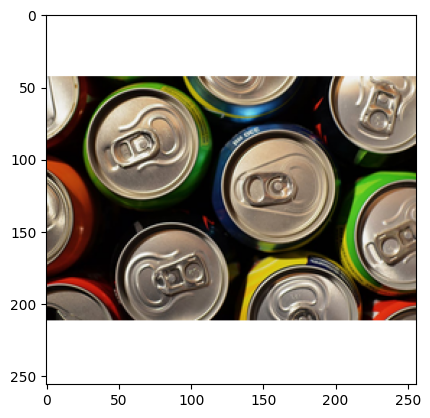

In [103]:
plt.imshow(Image.open(df2.path[480]))

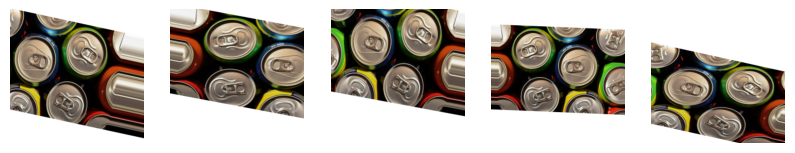

In [102]:
img = load_img(df['path'][480])  # Replace with your image path
x = img_to_array(img)  # Convert image to array
x = np.expand_dims(x, axis=0)  # Reshape to (1, height, width, channels)


i = 0
plt.figure(figsize=(10, 10))

for batch in datagen.flow(x, batch_size=1):
    plt.subplot(1, 5, i + 1)  # Create a subplot for each image
    plt.imshow(batch[0].astype('uint8'))  # Display the augmented image
    plt.axis('off')  # Turn off axis labels
    i += 1
    if i >= 5:  # Stop after displaying five images
        break

plt.show() 